# Gamete genotyping power analyses

The goal of this notebook is to assess the number of SNPs and gametes that are necessary to achieve *"good"* estimates of recombination rates, while also allowing for their to be missing data in our genomic samples. We could define "good" in terms of the average genetic distance between sequenced SNPs. 

In [1]:
# conda install ipcoal -c conda-forge -c bioconda -c eaton-lab
# conda install toyplot -c eaton-lab

In [2]:
import ipcoal
import numpy as np
import pandas as pd
import toyplot, toyplot.svg

### The "true" recombination rate
To test how well we can estimate a recombination rate we need to use a chromosome that has recombination rate across its length. This could be modeled as a perfectly continous variation, or, as we do here, it is modeled as varying discretely across different windows. In finished studies recombination rate maps are published as a table of windows with rates in the windows, so we use that same framework to represent the "true" recombination rates here. The table for our true chromosome will be based on the stats below.


In [6]:
# limit on the resolution of the true recombination map
NSNPS = 120
CHROMSIZE = int(1e7)

In [8]:
# average distance between SNPs in the true recombination map
INTER_KBPS = (CHROMSIZE / NSNPS) / 1000
print(int(INTER_KBPS), "Kbps between SNPs")

83 Kbps between SNPs


### Generate the true recombination map
It has 5 peaks across the chromosome with the highest rates 5X greater than the lowest rates (kinda). It is represented by a dataframe with positions delimiting windows, and a rate for each window. This is how recombination maps are published. 

In [9]:
# generate a sinusoidal recombination map
RECOMB_MAP = ipcoal.utils.generate_recomb_map(
    length=CHROMSIZE, 
    num_pos=NSNPS,
    num_peaks=5,
    height_peaks=5,
    even_spacing=True,
)

# convert to a dataframe
RECOMB_MAP = pd.DataFrame({
    "position": RECOMB_MAP[0],
    "recomb_rate": RECOMB_MAP[1],
})

# show the recomb map
RECOMB_MAP.head()

,position,recomb_rate
0,0.000000,0.000000
1,84033.613445,0.086615
2,168067.226891,0.340457
3,252100.840336,0.743939
4,336134.453782,1.269101


In [10]:
# draw the true rate 
canvas = toyplot.Canvas(width=500, height=250)
axes = canvas.cartesian(xlabel="Chromosome position", ylabel="Recomb. rate")
axes.plot(RECOMB_MAP.position, RECOMB_MAP.recomb_rate, stroke_width=3);

<svg class="toyplot-canvas-Canvas" height="250.0px" id="t649697feb7774500b07a17ab7cae0edc" preserveAspectRatio="xMidYMid meet" style="background-color:transparent;border-color:#292724;border-style:none;border-width:1.0;fill:rgb(16.1%,15.3%,14.1%);fill-opacity:1.0;font-family:Helvetica;font-size:12px;opacity:1.0;stroke:rgb(16.1%,15.3%,14.1%);stroke-opacity:1.0;stroke-width:1.0" viewBox="0 0 500.0 250.0" width="500.0px" xmlns="http://www.w3.org/2000/svg" xmlns:toyplot="http://www.sandia.gov/toyplot" xmlns:xlink="http://www.w3.org/1999/xlink"> <path d="M 50.0 200.0 L 53.36134453781513 197.4015566489029 L 56.72268907563025 189.7862774715812 L 60.08403361344538 177.6818390425699 L 63.4453781512605 161.92697996332566 L 66.80672268907563 143.61338313576678 L 70.16806722689076 124.01003106419309 L 73.52941176470588 104.47527574459379 L 76.890756302521 86.36271597898279 L 80.25210084033614 70.92740404720813 L 83.61344537815125 59.2388808469026 L 86.9747899159664 52.10706545523894 L 90.33613445378151 50.02613435983633 L 93.69747899159664 53.140279069199906 L 97.05882352941177 61.233714820278934 L 100.42016806722688 73.74563269800888 L 103.78151260504202 89.80905910722005 L 107.14285714285714 108.3109299532764 L 110.50420168067228 127.96921688197023 L 113.8655462184874 147.42176136093275 L 117.22689075630251 165.32066112714335 L 120.58823529411765 180.42566879154944 L 123.9495798319328 191.69013084124862 L 127.31092436974791 198.33351216912806 L 130.67226890756302 199.89548077411504 L 134.0336134453782 196.26780500457613 L 137.39495798319328 187.70185312673254 L 140.75630252100842 174.79117555932558 L 144.11764705882354 158.43037668324038 L 147.47899159663868 139.75312607336207 L 150.84033613445376 120.05360446739783 L 154.2016806722689 100.69682762366256 L 157.56302521008405 83.02406189117687 L 160.92436974789916 68.25988541962278 L 164.28571428571428 57.427334907318574 L 167.6470588235294 51.27701752370736 L 171.00840336134456 50.23509997045807 L 174.3697478991597 54.373778613934164 L 177.7310924369748 63.40627686737649 L 181.09243697478993 76.70671646330635 L 184.45378151260505 93.35348569946474 L 187.8151260504202 112.19309959347967 L 191.1764705882353 131.92012695974765 L 194.53781512605045 151.16764611568755 L 197.8991596638656 168.60196137660955 L 201.26050420168067 183.01501726062898 L 204.62184873949582 193.4081068549241 L 207.98319327731093 199.06107403806405 L 211.34453781512605 199.58221441028888 L 214.7058823529412 194.93541720532667 L 218.06722689075636 185.44266747120759 L 221.42857142857144 171.76173513940492 L 224.78991596638656 154.84059694736905 L 228.1512605042017 135.8517494025155 L 231.51260504201684 116.11096436212222 L 234.87394957983196 96.98611680308653 L 238.23529411764707 79.80240227155576 L 241.5966386554622 65.75051166810587 L 244.95798319327736 55.80412610497375 L 248.31932773109247 50.65244876706525 L 251.68067226890756 50.65244876706525 L 255.0420168067227 55.80412610497382 L 258.4033613445378 65.7505116681059 L 261.7647058823529 79.80240227155589 L 265.12605042016804 96.9861168030867 L 268.4873949579832 116.11096436212227 L 271.8487394957983 135.85174940251568 L 275.21008403361344 154.84059694736914 L 278.5714285714286 171.76173513940498 L 281.9327731092437 185.4426674712077 L 285.2941176470588 194.9354172053267 L 288.65546218487395 199.5822144102889 L 292.0168067226891 199.06107403806402 L 295.37815126050424 193.4081068549241 L 298.7394957983194 183.01501726062887 L 302.1008403361345 168.60196137660944 L 305.4621848739496 151.16764611568752 L 308.8235294117647 131.92012695974748 L 312.18487394957987 112.19309959347962 L 315.546218487395 93.3534856994647 L 318.9075630252101 76.70671646330621 L 322.26890756302527 63.406276867376434 L 325.6302521008404 54.373778613934164 L 328.9915966386555 50.23509997045807 L 332.3529411764706 51.27701752370736 L 335.7142857142858 57.42733490731865 L 339.0756302521009 68.25988541962285 L 342.436974789916 83.0240618911769 L 345.7983193277312 100.69682762366273 L 349.159663

### Sample N crossover events 

This will show us how accurate a recombination map **could** look if we sampled N exact recombination breakpoints. Of course, in reality we will not sample this efficiently since (1) we can only get information from variable sites; (2) we will only sample SNPs from sparsely spaced RAD markers; (3) we will have some missing data; (4) not all gametes are recombinant; (5) we will have some failed gametes. 


In [116]:
def get_crossovers_per_window(ngametes, recomb_map, seed=None):
    if seed:
        np.random.seed(seed)
    crossovers = np.random.multinomial(
        ngametes, 
        recomb_map.recomb_rate[:-1] / sum(recomb_map.recomb_rate)
    )
    return crossovers

In [16]:
# example: crossovers per window from 1000 random sampled recombination events
get_crossovers_per_window(1000, RECOMB_MAP)

array([ 0,  0,  1,  2,  9,  6,  9, 12, 15, 12, 11, 25, 15, 15, 16, 15, 13,
        9,  7,  5,  5,  2,  3,  1,  0,  0,  1,  6,  2,  8,  7, 14, 13, 18,
       15, 16, 12, 13, 14, 13, 14,  7,  7,  3,  3,  4,  1,  0,  0,  0,  3,
        5,  8, 10, 15, 11,  8, 15, 14, 15, 19, 23, 14,  7,  6, 10, 10,  8,
        3,  2,  0,  0,  0,  1,  4,  3,  3, 13,  8, 12, 10, 14, 11, 13, 20,
       15,  7,  7, 10,  8,  8,  4,  0,  2,  2,  0,  0,  0,  6,  6, 10, 10,
       12, 10, 18, 15, 20, 15, 19, 22, 15, 12, 10,  5,  6,  4,  4,  1,  0])

### Plot sampled events against true rates

This shows how increased sampling of gametes would increase power if every gamete was recombinant and if we knew the exact crossover location in each gamete. 

In [117]:
def plot_recomb_rate_and_sampled_crossovers(ngametes, recomb_map, seed=None):

    # set up the canvas and axes
    canvas = toyplot.Canvas(width=500, height=250)
    axes = canvas.cartesian(xlabel="Chromosome position", ylabel="Recomb. rate")

    # plot the true rate
    axes.plot(recomb_map.position[:-1], recomb_map.recomb_rate[:-1], stroke_width=3);

    # normalize sampled events so that the max event is ~5
    events = get_crossovers_per_window(ngametes, recomb_map, seed)
    events = 5.5 * (events / events.max())

    # plot the sampled crossovers per window
    axes.bars(
        recomb_map.position[:-1],
        recomb_map.position[1:],
        events,
        style={"stroke": "none", "fill": toyplot.color.Palette()[1]},
        opacity=0.25,
    );
    
    return canvas, axes

In [18]:
plot_recomb_rate_and_sampled_crossovers(300, RECOMB_MAP);
plot_recomb_rate_and_sampled_crossovers(3000, RECOMB_MAP);

<svg class="toyplot-canvas-Canvas" height="250.0px" id="td89dc13ec7f34d92bce76f4d2b1dffda" preserveAspectRatio="xMidYMid meet" style="background-color:transparent;border-color:#292724;border-style:none;border-width:1.0;fill:rgb(16.1%,15.3%,14.1%);fill-opacity:1.0;font-family:Helvetica;font-size:12px;opacity:1.0;stroke:rgb(16.1%,15.3%,14.1%);stroke-opacity:1.0;stroke-width:1.0" viewBox="0 0 500.0 250.0" width="500.0px" xmlns="http://www.w3.org/2000/svg" xmlns:toyplot="http://www.sandia.gov/toyplot" xmlns:xlink="http://www.w3.org/1999/xlink"> <path d="M 50.0 200.0 L 53.36134453781513 197.8346305407524 L 56.72268907563025 191.48856455965102 L 60.08403361344538 181.4015325354749 L 63.4453781512605 168.2724833027714 L 66.80672268907563 153.011152613139 L 70.16806722689076 136.6750258868276 L 73.52941176470588 120.39606312049483 L 76.890756302521 105.30226331581899 L 80.25210084033614 92.43950337267344 L 83.61344537815125 82.69906737241882 L 86.9747899159664 76.75588787936579 L 90.33613445378151 75.02177863319694 L 93.69747899159664 77.61689922433325 L 97.05882352941177 84.36142901689911 L 100.42016806722688 94.78802724834071 L 103.78151260504202 108.17421592268337 L 107.14285714285714 123.59244162773034 L 110.50420168067228 139.97434740164186 L 113.8655462184874 156.18480113411064 L 117.22689075630251 171.1005509392861 L 120.58823529411765 183.68805732629122 L 123.9495798319328 193.07510903437384 L 127.31092436974791 198.61126014094003 L 130.67226890756302 199.91290064509587 L 134.0336134453782 196.88983750381345 L 137.39495798319328 189.75154427227713 L 140.75630252100842 178.992646299438 L 144.11764705882354 165.35864723603365 L 147.47899159663868 149.7942717278017 L 150.84033613445376 133.37800372283155 L 154.2016806722689 117.24735635305213 L 157.56302521008405 102.52005157598072 L 160.92436974789916 90.21657118301897 L 164.28571428571428 81.1894457560988 L 167.6470588235294 76.06418126975615 L 171.00840336134456 75.19591664204839 L 174.3697478991597 78.6448155116118 L 177.7310924369748 86.17189738948042 L 181.09243697478993 97.25559705275528 L 184.45378151260505 111.12790474955395 L 187.8151260504202 126.82758299456637 L 191.1764705882353 143.2667724664564 L 194.53781512605045 159.30637176307295 L 197.8991596638656 173.83496781384127 L 201.26050420168067 185.84584771719082 L 204.62184873949582 194.50675571243673 L 207.98319327731093 199.21756169838673 L 211.34453781512605 199.6518453419074 L 214.7058823529412 195.77951433777224 L 218.06722689075636 187.86888955933964 L 221.42857142857144 176.4681126161708 L 224.78991596638656 162.36716412280754 L 228.1512605042017 146.54312450209625 L 231.51260504201684 130.09247030176851 L 234.87394957983196 114.15509733590545 L 238.23529411764707 99.83533522629646 L 241.5966386554622 88.12542639008822 L 244.95798319327736 79.83677175414479 L 248.31932773109247 75.54370730588772 L 251.68067226890756 75.54370730588772 L 255.0420168067227 79.83677175414486 L 258.4033613445378 88.12542639008825 L 261.7647058823529 99.83533522629659 L 265.12605042016804 114.15509733590558 L 268.4873949579832 130.09247030176854 L 271.8487394957983 146.54312450209636 L 275.21008403361344 162.3671641228076 L 278.5714285714286 176.4681126161708 L 281.9327731092437 187.86888955933975 L 285.2941176470588 195.77951433777227 L 288.65546218487395 199.65184534190743 L 292.0168067226891 199.2175616983867 L 295.37815126050424 194.50675571243673 L 298.7394957983194 185.8458477171907 L 302.1008403361345 173.8349678138412 L 305.4621848739496 159.30637176307292 L 308.8235294117647 143.26677246645622 L 312.18487394957987 126.82758299456637 L 315.546218487395 111.1279047495539 L 318.9075630252101 97.25559705275518 L 322.26890756302527 86.17189738948036 L 325.6302521008404 78.6448155116118 L 328.9915966386555 75.19591664204839 L 332.3529411764706 76.06418126975615 L 335.7142857142858 81.18944575609888 L 339.0756302521009 90.21657118301904 L 342.436974789916 102.52005157598074 L 345.7983193277312 117.24735635305227 L 349.15966386554

<svg class="toyplot-canvas-Canvas" height="250.0px" id="tc56cbbfac6ab4cb2891c590ef5aba7c4" preserveAspectRatio="xMidYMid meet" style="background-color:transparent;border-color:#292724;border-style:none;border-width:1.0;fill:rgb(16.1%,15.3%,14.1%);fill-opacity:1.0;font-family:Helvetica;font-size:12px;opacity:1.0;stroke:rgb(16.1%,15.3%,14.1%);stroke-opacity:1.0;stroke-width:1.0" viewBox="0 0 500.0 250.0" width="500.0px" xmlns="http://www.w3.org/2000/svg" xmlns:toyplot="http://www.sandia.gov/toyplot" xmlns:xlink="http://www.w3.org/1999/xlink"> <path d="M 50.0 200.0 L 53.36134453781513 197.8346305407524 L 56.72268907563025 191.48856455965102 L 60.08403361344538 181.4015325354749 L 63.4453781512605 168.2724833027714 L 66.80672268907563 153.011152613139 L 70.16806722689076 136.6750258868276 L 73.52941176470588 120.39606312049483 L 76.890756302521 105.30226331581899 L 80.25210084033614 92.43950337267344 L 83.61344537815125 82.69906737241882 L 86.9747899159664 76.75588787936579 L 90.33613445378151 75.02177863319694 L 93.69747899159664 77.61689922433325 L 97.05882352941177 84.36142901689911 L 100.42016806722688 94.78802724834071 L 103.78151260504202 108.17421592268337 L 107.14285714285714 123.59244162773034 L 110.50420168067228 139.97434740164186 L 113.8655462184874 156.18480113411064 L 117.22689075630251 171.1005509392861 L 120.58823529411765 183.68805732629122 L 123.9495798319328 193.07510903437384 L 127.31092436974791 198.61126014094003 L 130.67226890756302 199.91290064509587 L 134.0336134453782 196.88983750381345 L 137.39495798319328 189.75154427227713 L 140.75630252100842 178.992646299438 L 144.11764705882354 165.35864723603365 L 147.47899159663868 149.7942717278017 L 150.84033613445376 133.37800372283155 L 154.2016806722689 117.24735635305213 L 157.56302521008405 102.52005157598072 L 160.92436974789916 90.21657118301897 L 164.28571428571428 81.1894457560988 L 167.6470588235294 76.06418126975615 L 171.00840336134456 75.19591664204839 L 174.3697478991597 78.6448155116118 L 177.7310924369748 86.17189738948042 L 181.09243697478993 97.25559705275528 L 184.45378151260505 111.12790474955395 L 187.8151260504202 126.82758299456637 L 191.1764705882353 143.2667724664564 L 194.53781512605045 159.30637176307295 L 197.8991596638656 173.83496781384127 L 201.26050420168067 185.84584771719082 L 204.62184873949582 194.50675571243673 L 207.98319327731093 199.21756169838673 L 211.34453781512605 199.6518453419074 L 214.7058823529412 195.77951433777224 L 218.06722689075636 187.86888955933964 L 221.42857142857144 176.4681126161708 L 224.78991596638656 162.36716412280754 L 228.1512605042017 146.54312450209625 L 231.51260504201684 130.09247030176851 L 234.87394957983196 114.15509733590545 L 238.23529411764707 99.83533522629646 L 241.5966386554622 88.12542639008822 L 244.95798319327736 79.83677175414479 L 248.31932773109247 75.54370730588772 L 251.68067226890756 75.54370730588772 L 255.0420168067227 79.83677175414486 L 258.4033613445378 88.12542639008825 L 261.7647058823529 99.83533522629659 L 265.12605042016804 114.15509733590558 L 268.4873949579832 130.09247030176854 L 271.8487394957983 146.54312450209636 L 275.21008403361344 162.3671641228076 L 278.5714285714286 176.4681126161708 L 281.9327731092437 187.86888955933975 L 285.2941176470588 195.77951433777227 L 288.65546218487395 199.65184534190743 L 292.0168067226891 199.2175616983867 L 295.37815126050424 194.50675571243673 L 298.7394957983194 185.8458477171907 L 302.1008403361345 173.8349678138412 L 305.4621848739496 159.30637176307292 L 308.8235294117647 143.26677246645622 L 312.18487394957987 126.82758299456637 L 315.546218487395 111.1279047495539 L 318.9075630252101 97.25559705275518 L 322.26890756302527 86.17189738948036 L 325.6302521008404 78.6448155116118 L 328.9915966386555 75.19591664204839 L 332.3529411764706 76.06418126975615 L 335.7142857142858 81.18944575609888 L 339.0756302521009 90.21657118301904 L 342.436974789916 102.52005157598074 L 345.7983193277312 117.24735635305227 L 349.15966386554

## (II) Approximating real gamete data...

## The parental genome

**The parental genome sequence is initially unknown, and we do not plan to directly sequence it**. Instead, we will be able to infer the phased parental genome at all sequenced sites using just the gamete data. To prove this, however, we will start by generating a true parental diploid genome from which gametes will later be generated. The parent genome is diploid and contains N heterozygous sites. Each SNP is randomly labeled as either 0/1 on either of the two chromosomes. The phase of each chromosome is the ordered sequence of 0s and 1s. 

In [118]:
def get_parent(recomb_map, nsnps, seed):
    """
    Returns a DataFrame of parent genome genotyped at nsnps
    locations each randomly assigned a binary genotype.
    """
    # set seed
    if seed:
        np.random.seed(seed)

    # get nsnps random positions in genome
    rpos = np.random.choice(
        int(recomb_map.position.iloc[-1]), 
        int(nsnps), 
        replace=False
    )
    spos = sorted(rpos)

    # random binary snp genotypes 
    chrom1 = np.random.binomial(1, 0.5, int(nsnps))
    chrom2 = np.abs(1 - chrom1)

    # store position and either 0 or 1
    parent = pd.DataFrame({
        "position": spos,
        "chrom0": chrom1,
        "chrom1": chrom2,
    })
    return parent

In [119]:
# get parent 
parent = get_parent(RECOMB_MAP, NSNPS, seed=123)

# show
parent.head(10)

,position,chrom0,chrom1
0,54315,0,1
1,211184,1,0
2,238801,0,1
3,272020,1,0
4,954246,1,0
5,1258772,0,1
6,1610251,1,0
7,1681281,0,1
8,1687128,0,1
9,1698882,0,1


### Gametes are recombinant products of the parent
Here we want to sample recombinant cross-over events with a probability over the length of the chromosome described by the recombination map, and for each crossover event we will create a new recombinant genome formed by parts of both chromosomes from the parent. We restrict each gamete to have exactly 1 crossover on the chromosome (in reality many chromosomes may have 0 or sometimes >1 crossover). 

In [21]:
def get_gametes(parent, recomb_map, ngametes, seed=None):
    """
    Returns an array with recombinant gamete haplotypes
    sampled from the parent where crossovers occur 
    according to a parameterized PDF.
    """
    # set seed
    np.random.seed(seed)

    # array to store gamete haplotypes. shape=(ngametes, nsnps)
    arr = np.zeros((ngametes, parent.shape[0]), dtype=np.int8)
    
    # fill each row of arr with parent chrom: 11111|22222
    idx = 0
    while 1:

        # get 1 window containing a sampled crossover 
        cwindow = np.where(get_crossovers_per_window(1, recomb_map))[0][0]
        
        # sample a uniform position in this window
        cpos = np.random.uniform(
            recomb_map.position[cwindow], 
            recomb_map.position[cwindow + 1]
        )

        # get index of SNP left and right of crossover
        snpr = parent.loc[parent.position >= cpos]
        snpl = parent.loc[parent.position < cpos]

        # skip if crossover happened on the ends
        if (snpr.size == 0) or (snpl.size == 0):
            continue
        cvs = snpr.index[0]

        # random parent chrom at 5' end
        c1 = np.random.binomial(1, 0.5)
        c2 = abs(1 - c1)

        # crossover to other parent chrom at cv
        arr[idx][:cvs] = parent.iloc[:cvs, c1 + 1]
        arr[idx][cvs:] = parent.iloc[cvs:, c2 + 1]

        # advance counter and exit
        idx += 1
        if idx == ngametes:
            break
    return arr

In [23]:
gametes = get_gametes(parent, RECOMB_MAP, ngametes=100, seed=123)
gametes

array([[1, 0, 1, ..., 1, 1, 0],
       [1, 0, 1, ..., 1, 1, 0],
       [1, 0, 1, ..., 1, 1, 0],
       ...,
       [0, 1, 0, ..., 0, 0, 1],
       [1, 0, 1, ..., 1, 1, 0],
       [0, 1, 0, ..., 0, 0, 1]], dtype=int8)

### Add missing data
Here we could add in a lot of missing data to gamete sequences to emulate empirical data. This replaces the 0 or 1 with a 9 to represent missing data at random positions to fill X percent as missing data. 

In [100]:
def add_missing_data_to_gametes(gametes, proportion=0.0, seed=None):
    
    # set random seed and make a copy of gametes
    np.random.seed(seed)
    
    # sample SNPs and convert to missing (9)
    gams = gametes.copy()
    mask = np.random.binomial(1, proportion, gams.shape).astype(np.bool)
    gams[mask] = 9
    
    # do not allow ALL data in a column to be lost else the SNP is lost
    dropcol = np.all(gams == 9, axis=0)
    droprow = np.all(gams == 9, axis=1)
    gams = gams[~droprow, :]
    gams = gams[:, ~dropcol]
    
    # do not allow gametes without crossover
    dropvar = np.any(gams == 0, axis=1) & np.any(gams == 1, axis=1)
    gams = gams[dropvar, :]

    # print filtering info
    print("{} -> {}, {} {} {}".format(
        gametes.shape, 
        gams.shape, 
        droprow.sum(), dropcol.sum(), np.invert(dropvar).sum(), 
    ))
    
    return gams

In [109]:
missgametes = add_missing_data_to_gametes(gametes, 0.45, seed=123)
missgametes

(100, 120) -> (100, 120), 0 0 0


array([[9, 0, 1, ..., 1, 1, 9],
       [9, 0, 1, ..., 9, 1, 9],
       [1, 0, 9, ..., 1, 9, 0],
       ...,
       [9, 1, 9, ..., 9, 9, 9],
       [1, 9, 1, ..., 9, 1, 0],
       [9, 9, 0, ..., 9, 9, 9]], dtype=int8)

### Recode gametes to represent parental genome segments
At this point we have each gamete haplotyped at many SNPS (or with some missing data) with the SNP positions known from mapping to a reference chromosome. We do not yet know where the crossovers occurred, nor do we know the phased parent chrosomes. However, we can infer both from the gamete data, even with missing data. 

In [113]:
def recode_gametes(gametes, impute_missing=False):
    """
    Follow a most-common path through gametes starting from 
    the first 0 genotype to recode all SNPs as coming from 
    parent genome copy 0 or 1.
    """
    # used to store a path sequence: e.g., 0-1-0-1-1-1-0-0-1-1...
    path = np.zeros(gametes.shape[1], dtype=int)
    
    # follow the most common path starting from 0
    for idx in range(1, gametes.shape[1]):
        
        # mask to select rows where last base is on path
        mask = gametes[:, idx - 1] == path[idx - 1]
        
        # get most common next base
        nextcol = gametes[mask, idx]
        nextbase = int(round(nextcol[nextcol != 9].mean()))
        path[idx] = nextbase
        
    # recode gametes as being on or off path0
    recoded = (gametes == path).astype(int)
    
    # impute missing data at all 9s: 0-0-9-9-9-1-1-1-1
    if 9 in gametes:
        
        # put missing values back in
        recoded[gametes == 9] = 9
        
        # store new recoded array
        mrecoded = np.zeros(recoded.shape, dtype=int)
        mask = np.zeros(recoded.shape[0], dtype=bool)
        
        # is it 111100000 or 0000011111
        for idx in range(recoded.shape[0]):
            
            # select a row
            gam = recoded[idx]
            
            # get indices of 0 and 1 sites
            gam0idx = np.where(gam == 0)[0]
            gam1idx = np.where(gam == 1)[0]
            
            # if it doesn't have both 0 and 1 then it is dropped
            if not (gam0idx.size and gam1idx.size):
                mask[idx] = 1
                
            # sample crossover in region between last 0/1 and next 0/1
            else:
                if gam0idx[0] < gam1idx[0]:
                    crsv = int(np.random.uniform(gam0idx[-1], gam1idx[0] - 1))
                    mrecoded[idx, crsv + 1:] = 1
                else:
                    crsv = int(np.random.uniform(gam1idx[-1], gam0idx[0] - 1))
                    mrecoded[idx, :crsv + 1] = 1
            # debugging       
            #print(idx, crsv, sum(mrecoded[idx] == 0), sum(mrecoded[idx] == 1))
        
        # drop unresolvable gametes
        if mask.sum():
            print("dropped {} unresolvable gametes: {}".format(mask.sum(), np.where(mask)[0]))
        if not impute_missing:
            recoded = mrecoded[np.invert(mask), :]
            recoded[gametes[np.invert(mask)] == 9] = 9
        else:
            recoded = mrecoded[np.invert(mask), :]
        
    # get parent genomes
    path0 = path
    path1 = np.invert(path.astype(bool)).astype(int)
    
    return recoded, path0, path1

In [114]:
# recoding is easy with no missing data
rgametes, parent0, parent1 = recode_gametes(gametes)
rgametes

array([[0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 1, 1],
       [1, 1, 1, ..., 0, 0, 0]])

In [115]:
# with some missing data we sometimes need to drop some gametes (no crossovers)
mrgametes, mparent0, mparent1 = recode_gametes(missgametes)
mrgametes

dropped 1 unresolvable gametes: [78]


array([[9, 0, 0, ..., 1, 1, 9],
       [9, 0, 0, ..., 9, 1, 9],
       [0, 0, 9, ..., 1, 9, 1],
       ...,
       [9, 1, 9, ..., 9, 9, 9],
       [0, 9, 0, ..., 9, 1, 1],
       [9, 9, 1, ..., 9, 9, 9]])

In [1903]:
irgametes, iparent0, iparent1 = recode_gametes(missgametes, impute_missing=True)
irgametes

dropped 9 unresolvable gametes: [  3  12  24  72 101 110 115 135 181]


array([[0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       ...,
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [1, 1, 1, ..., 0, 0, 0]])

### Confirm that inferred parent chroms match true

In [1904]:
# check in parents inferred w/o missing data
print(sum(parent.chrom0 == parent0))
print(sum(parent.chrom0 == parent1))
print(sum(parent.chrom1 == parent0))
print(sum(parent.chrom1 == parent1))

120
0
0
120


In [1905]:
# check in parents inferred with missing data
print(sum(parent.chrom0 == mparent0))
print(sum(parent.chrom0 == mparent1))
print(sum(parent.chrom1 == mparent0))
print(sum(parent.chrom1 == mparent1))

120
0
0
120


### Draw gametes haplotypes

In [1906]:
def draw_gamete_haplotypes(rgametes, width=300, height=600, canvas=None, col0="red", col1="blue", col2="grey", **kwargs):

    # set up a canvas
    if not canvas:
        canvas = toyplot.Canvas(width, height)
        
    # set up axes
    table = canvas.table(
        rows=rgametes.shape[0],
        columns=rgametes.shape[1],
        **kwargs,
    )

    # color gametes haplotypes from parent 1 blue
    idxs0 = np.where(rgametes[:, :] == 0)
    table.cells.cell[idxs0[0], idxs0[1]].style = {"fill": col0, "opacity": 0.5}

    # color parent haplotype from parent 2 red
    idxs0 = np.where(rgametes[:, :] == 1)
    table.cells.cell[idxs0[0], idxs0[1]].style = {"fill": col1, "opacity": 0.5}
    
    # color missing data as grey
    idxs0 = np.where(rgametes[:, :] == 9)
    table.cells.cell[idxs0[0], idxs0[1]].style = {"fill": col2, "opacity": 0.5}

    return canvas, table

In [1907]:
# gamete haplotypes for 100 gametes at NSNPs
draw_gamete_haplotypes(rgametes[:100, :], height=600, width=300, label="gamete haplotypes");

<svg class="toyplot-canvas-Canvas" height="600.0px" id="t93281979805743a3b2e9af33536416f0" preserveAspectRatio="xMidYMid meet" style="background-color:transparent;border-color:#292724;border-style:none;border-width:1.0;fill:rgb(16.1%,15.3%,14.1%);fill-opacity:1.0;font-family:Helvetica;font-size:12px;opacity:1.0;stroke:rgb(16.1%,15.3%,14.1%);stroke-opacity:1.0;stroke-width:1.0" viewBox="0 0 300.0 600.0" width="300.0px" xmlns="http://www.w3.org/2000/svg" xmlns:toyplot="http://www.sandia.gov/toyplot" xmlns:xlink="http://www.w3.org/1999/xlink"> gamete haplotypes <rect height="5.0" style="fill:rgb(100%,0%,0%);fill-opacity:1.0;opacity:0.5;stroke:none" width="1.66666666

In [1908]:
# drop gametes that were dropped in the missing data data sets
sgametes = rgametes[[i for i in range(rgametes.shape[0]) if i not in [3, 12, 24, 72, 101, 110, 115, 135, 181]], :]

# make an array showing the difference between rgametes and imputed rgametes
diff = np.zeros(irgametes.shape)
diff[sgametes != irgametes] = 1

# draw imputation error
draw_gamete_haplotypes(
    diff[:100, :],
    height=600, width=300, 
    label="75% missing data imputation error", 
    col0='grey', col1='black',
);

<svg class="toyplot-canvas-Canvas" height="600.0px" id="t2ca84104012d4e33b721777aa2c33e21" preserveAspectRatio="xMidYMid meet" style="background-color:transparent;border-color:#292724;border-style:none;border-width:1.0;fill:rgb(16.1%,15.3%,14.1%);fill-opacity:1.0;font-family:Helvetica;font-size:12px;opacity:1.0;stroke:rgb(16.1%,15.3%,14.1%);stroke-opacity:1.0;stroke-width:1.0" viewBox="0 0 300.0 600.0" width="300.0px" xmlns="http://www.w3.org/2000/svg" xmlns:toyplot="http://www.sandia.gov/toyplot" xmlns:xlink="http://www.w3.org/1999/xlink"> 75% missing data imputation error <rect height="5.0" style="fill:rgb(50.2%,

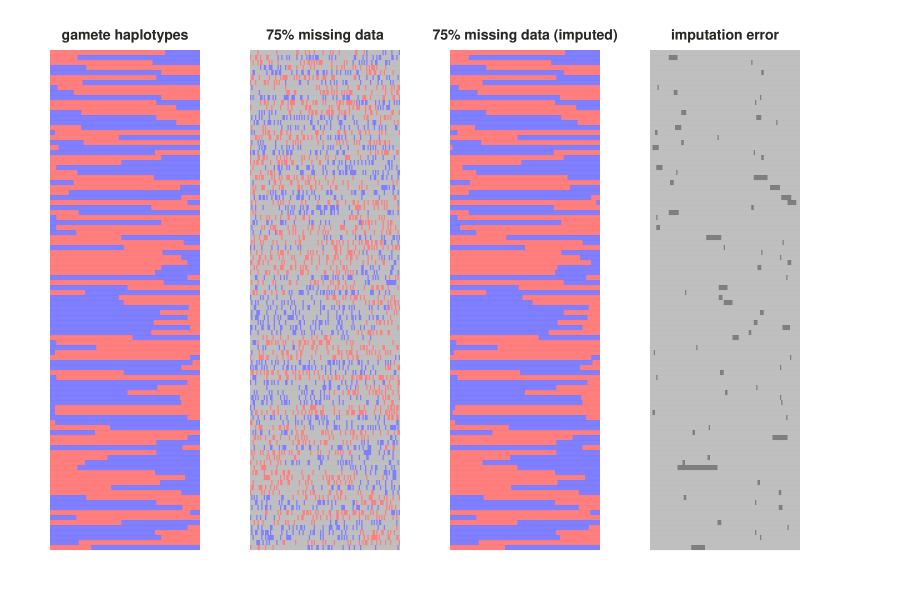

In [1909]:
canvas = toyplot.Canvas(width=900, height=600)

draw_gamete_haplotypes(
    sgametes[:100, :],
    label="gamete haplotypes",
    canvas=canvas,
    bounds=(50, 200, 50, 550)
);

draw_gamete_haplotypes(
    mrgametes[:100, :],
    label="75% missing data",
    canvas=canvas,
    bounds=(250, 400, 50, 550)
);

draw_gamete_haplotypes(
    irgametes[:100, :],
    label="75% missing data (imputed)",
    canvas=canvas,
    bounds=(450, 600, 50, 550)
);

draw_gamete_haplotypes(    
    diff[:100, :],
    label="imputation error", 
    col0='grey', col1='black',
    canvas=canvas,
    bounds=(650, 800, 50, 550)
);

toyplot.svg.render(canvas, "../figures/haplotypes-100SNPs-75pctmissing.svg")
canvas

### Estimate recombination rate from data

In [1910]:
def recomb_frequencies(rgametes, parent):
    
    # map crossovers to intervals (nsnps - 1)
    breakpoints = np.zeros(rgametes.shape[1] - 1, dtype=int)

    # map to interval ending at idx
    for idx in range(rgametes.shape[0]):
        breakpoint = np.where(rgametes[idx] != rgametes[idx, 0])[0]
        
        if not breakpoint.size:
            print(idx, rgametes[idx])

        # store where 0/1 transition occurred
        breakpoints[breakpoint[0] - 1] += 1
    
    # size of each inter-SNP region
    nbps = parent.position.values[1:] - parent.position.values[:-1]
    
    # get ncrossovers / length of each region
    rmap = pd.DataFrame({
        "start": parent.position.values[:-1],
        "end": parent.position.values[1:],
        "nbps": nbps,
        "crossovers": breakpoints,
        "estimate": breakpoints / nbps,
    })        

    # count proportion of recombs observed in each interval
    # ahist = breakpoints / breakpoints.max()
    return rmap

In [1911]:
recomb_frequencies(rgametes, parent).head()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199


,start,end,nbps,crossovers,estimate
0,54315,211184,156869,0,0.000000
1,211184,238801,27617,0,0.000000
2,238801,272020,33219,0,0.000000
3,272020,954246,682226,15,0.000022
4,954246,1258772,304526,9,0.000030


### One function to do it all

In [122]:
def fit_recombination_rates(recomb_map, nsnps, ngametes, missing=0.0, seed=None):
    """
    Given a chromosome (genome_size), a number of SNP positions to
    be genotyped, and a number of gametes to be sequenced, infer 
    the recombination rate between each SNP position. Returns the
    parental genome as a pd.DataFrame and a vector of floats of 
    length nsnps as a np.ndarray.
    """
    # get diploid parent genome with random SNP positions and states
    parent = get_parent(recomb_map, nsnps, seed)
    
    # get gametes from parent genome with recombination rate applied
    # as a cosine function with two cycles.
    gametes = get_gametes(parent, recomb_map, ngametes, seed)
    
    # add missing data 
    missgametes = add_missing_data_to_gametes(gametes, missing, seed)
    
    # recode gametes and infer parental genomes based on the frequency
    # of bases at each site across the genotyped gametes
    rgametes, parent0, parent1 = recode_gametes(missgametes, impute_missing=True)
    
    # get frequencies of crossovers between each SNP
    rmap = recomb_frequencies(rgametes, parent)
    
    return parent, rmap

In [1913]:
# inferred parent and recombination map from gametes simulated from a True RECOMB_MAP
par, rmap = fit_recombination_rates(RECOMB_MAP, 300, 3000, 0.25, 123)
rmap.head()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

,start,end,nbps,crossovers,estimate
0,1939,10758,8819,0,0.000000
1,10758,54315,43557,0,0.000000
2,54315,146995,92680,2,0.000022
3,146995,211184,64189,2,0.000031
4,211184,238801,27617,1,0.000036


In [1914]:
# inferred parent and recombination map from gametes simulated from a True RECOMB_MAP
par, rmap = fit_recombination_rates(RECOMB_MAP, 120, 7600, 0.25, 123)
rmap.head()

dropped 7 unresolvable gametes: [ 536 1239 1754 2696 5445 6660 7105]
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
2

4434
4435
4436
4437
4438
4439
4440
4441
4442
4443
4444
4445
4446
4447
4448
4449
4450
4451
4452
4453
4454
4455
4456
4457
4458
4459
4460
4461
4462
4463
4464
4465
4466
4467
4468
4469
4470
4471
4472
4473
4474
4475
4476
4477
4478
4479
4480
4481
4482
4483
4484
4485
4486
4487
4488
4489
4490
4491
4492
4493
4494
4495
4496
4497
4498
4499
4500
4501
4502
4503
4504
4505
4506
4507
4508
4509
4510
4511
4512
4513
4514
4515
4516
4517
4518
4519
4520
4521
4522
4523
4524
4525
4526
4527
4528
4529
4530
4531
4532
4533
4534
4535
4536
4537
4538
4539
4540
4541
4542
4543
4544
4545
4546
4547
4548
4549
4550
4551
4552
4553
4554
4555
4556
4557
4558
4559
4560
4561
4562
4563
4564
4565
4566
4567
4568
4569
4570
4571
4572
4573
4574
4575
4576
4577
4578
4579
4580
4581
4582
4583
4584
4585
4586
4587
4588
4589
4590
4591
4592
4593
4594
4595
4596
4597
4598
4599
4600
4601
4602
4603
4604
4605
4606
4607
4608
4609
4610
4611
4612
4613
4614
4615
4616
4617
4618
4619
4620
4621
4622
4623
4624
4625
4626
4627
4628
4629
4630
4631
4632
4633


,start,end,nbps,crossovers,estimate
0,54315,211184,156869,2,0.000013
1,211184,238801,27617,20,0.000724
2,238801,272020,33219,121,0.003642
3,272020,954246,682226,556,0.000815
4,954246,1258772,304526,425,0.001396


### Draw by mapping intervals to genomic positions

In [120]:
def draw_recomb(recomb_map, parent, rmap, mult=None):
    
    # get canvas and axes
    canvas = toyplot.Canvas(width=600, height=280)
    axes = canvas.cartesian(
        xlabel="Genomic position",
        ylabel="Recombination rate (x1e-6)"
    )

    # the True recomb rate 
    axes.plot(recomb_map.position, recomb_map.recomb_rate, stroke_width=3);

    # the SNP genotyped positions
    axes.scatterplot(
        parent.position, 
        np.repeat(-0.2, parent.position.size),
        marker="|", 
        size=4,
        mstyle={"stroke-width": 0.75},
    )

    # multiplier 
    if not mult:
        mult = recomb_map.position.iloc[-1] / rmap.crossovers.sum()
    print('multiplier', mult)

    # smooth the estimated rate
    window = 3
    axes.plot(
        rmap.start, 
        pd.Series(rmap.estimate).rolling(window=window, center=True).mean() * mult,  
        opacity=0.70,
    );
    
    axes.x.ticks.show = True
    axes.y.ticks.show = True
    return canvas, axes

## RESULTS

Increasing the number of SNPs/loci increases the resolution and thus accuracy when there are rapid changes in recombination rates across the chromosome. Increasing the number of gametes reduces the variance in estimates of recomination rates in any given window. Missing data primary decreases the resolution, but overall has very little effect on the results even at high percentages (e.g. 75%). 

In [123]:
parent, rmap = fit_recombination_rates(RECOMB_MAP, nsnps=120, ngametes=380, missing=0, seed=1234)
canvas, axes = draw_recomb(RECOMB_MAP, parent, rmap, 45000)
toyplot.svg.render(canvas, "../figures/fit-120S-380G-0M.svg")
canvas

(380, 120) -> (380, 120), 0 0 0


NameError: name 'recomb_frequencies' is not defined

3 5500


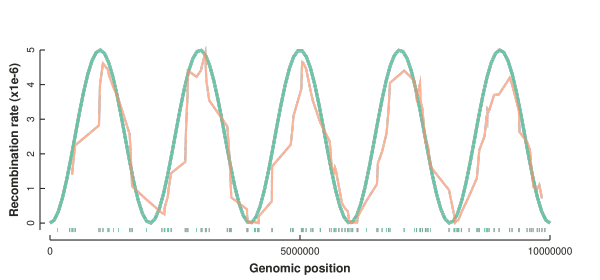

In [1887]:
parent, rmap = fit_recombination_rates(RECOMB_MAP, nsnps=120, ngametes=380 * 10, missing=0, seed=1234)
canvas, axes = draw_recomb(RECOMB_MAP, parent, rmap, 5500)
toyplot.svg.render(canvas, "../figures/fit-120S-3800G-0M.svg")
canvas

3 3200


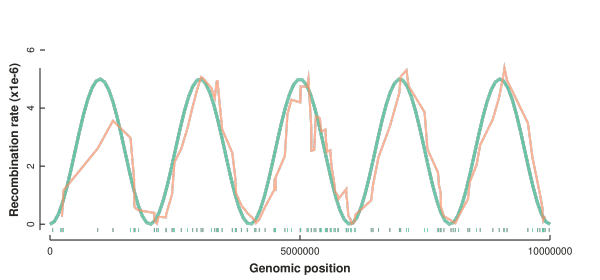

In [1888]:
parent, rmap = fit_recombination_rates(RECOMB_MAP, nsnps=120, ngametes=380 * 20, missing=0.0, seed=123)
canvas, axes = draw_recomb(RECOMB_MAP, parent, rmap, mult=3200)
toyplot.svg.render(canvas, "../figures/fit-120S-7600G-0M.svg")
canvas

In [1890]:
parent, rmap = fit_recombination_rates(RECOMB_MAP, nsnps=120, ngametes=380 * 20, missing=0.25, seed=123)
canvas, axes = draw_recomb(RECOMB_MAP, parent, rmap, mult=3200)
toyplot.svg.render(canvas, "../figures/fit-120S-7600G-25M.svg")
canvas

dropped 7 unresolvable gametes: [ 536 1239 1754 2696 5445 6660 7105]


IndexError: index 0 is out of bounds for axis 0 with size 0

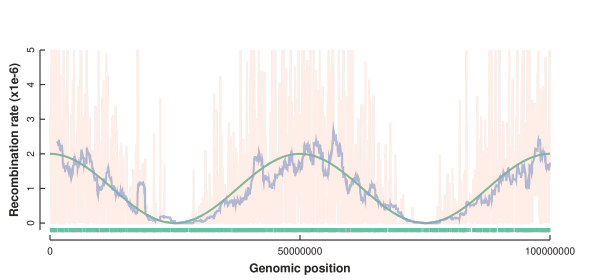

In [347]:
parent, rmap = fit_recombination_rates(1e8, 2000, 2000, 123)
canvas, axes = draw_recomb(parent, rmap, 1e8)
toyplot.svg.render(canvas, "figures/recomb-fit-1e8g-2Ksnps-2Kgams")
canvas

### Recombination rate map (interval table)

In [70]:
# start: position of SNP to left of interval
# end: position of SNP to right of interval
# crossovers: observed crossovers in this gamete set in interval
# estimate: estimated rate as crossovers / length of interval
# rate: true rate from integral of curve in this interval

# get interval lengths
nbps = parent.position.values[1:] - parent.position.values[:-1]

rmap = pd.DataFrame({
    "start": parent.position.values[:-1],
    "end": parent.position.values[1:],
    "nbps": nbps,
    "crossovers": breakpoints,
    "estimate": breakpoints / nbps,
    #"rate": 
})

rmap.head(10)

,start,end,nbps,crossovers,estimate
0,11842,13186,1344,8,0.005952
1,13186,14921,1735,10,0.005764
2,14921,17220,2299,7,0.003045
3,17220,29410,12190,49,0.004020
4,29410,44106,14696,57,0.003879
5,44106,55319,11213,44,0.003924
6,55319,112643,57324,175,0.003053
7,112643,113523,880,5,0.005682
8,113523,113874,351,0,0.000000
9,113874,118435,4561,11,0.002412
